In [ ]:
!pip install opencv-contrib-python

In [ ]:
!pip install caer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 809.5/809.5 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 98.8 MB/s eta 0:00:00


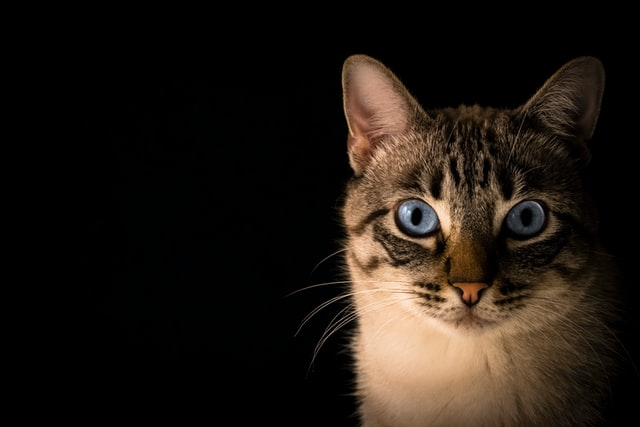

In [1]:
import cv2 as cv
from io import BytesIO
import requests
import numpy as np
from google.colab.patches import cv2_imshow # Import the Colab specific display function


# Construct the raw content URL for the image
image_url = "https://raw.githubusercontent.com/jasmcaus/opencv-course/master/Resources/Photos/cat.jpg"
# Download the image data
response = requests.get(image_url)
image_bytes = BytesIO(response.content)
# Read the image using OpenCV or Caer
# Using OpenCV
# Reset the BytesIO object's position to the beginning before reading again
image_bytes.seek(0)
image_np = np.frombuffer(image_bytes.read(), np.uint8)
img_cv = cv.imdecode(image_np, cv.IMREAD_COLOR)
# Display the image using the Colab specific function
cv2_imshow(img_cv)


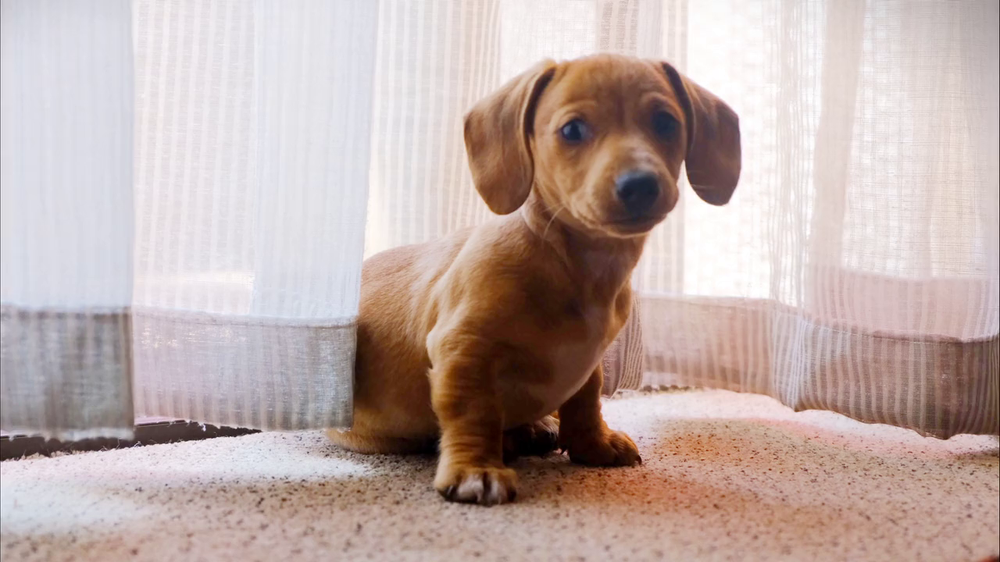

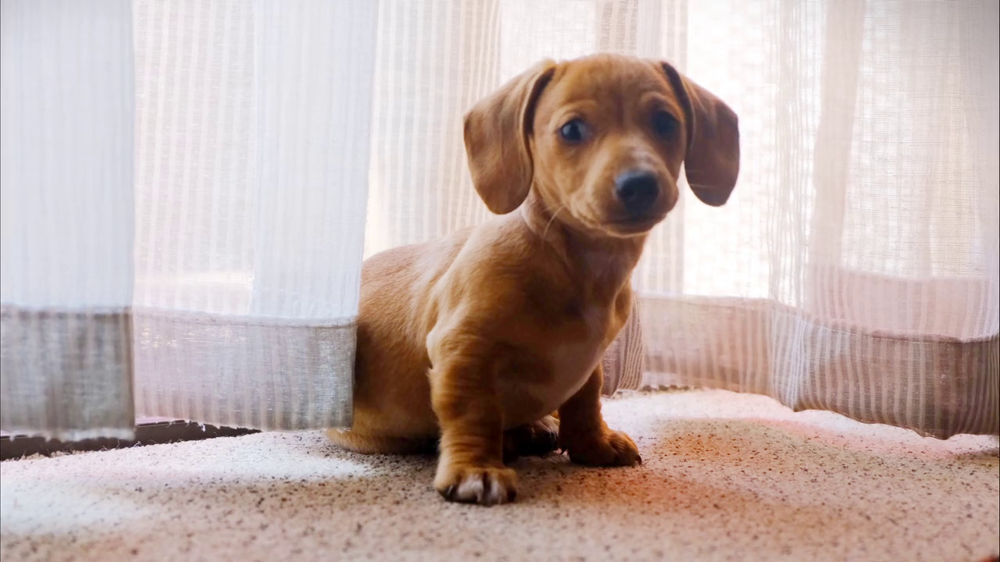

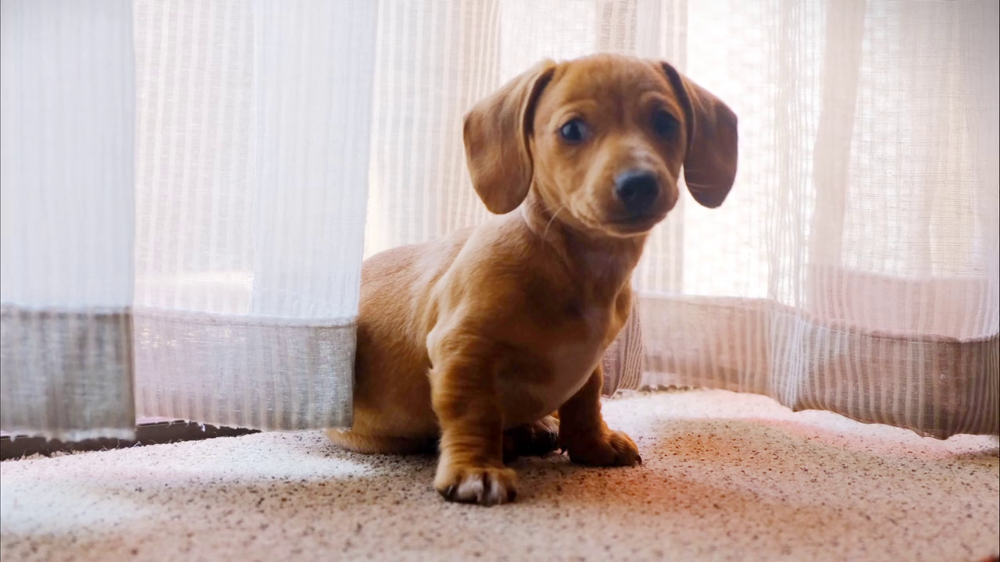

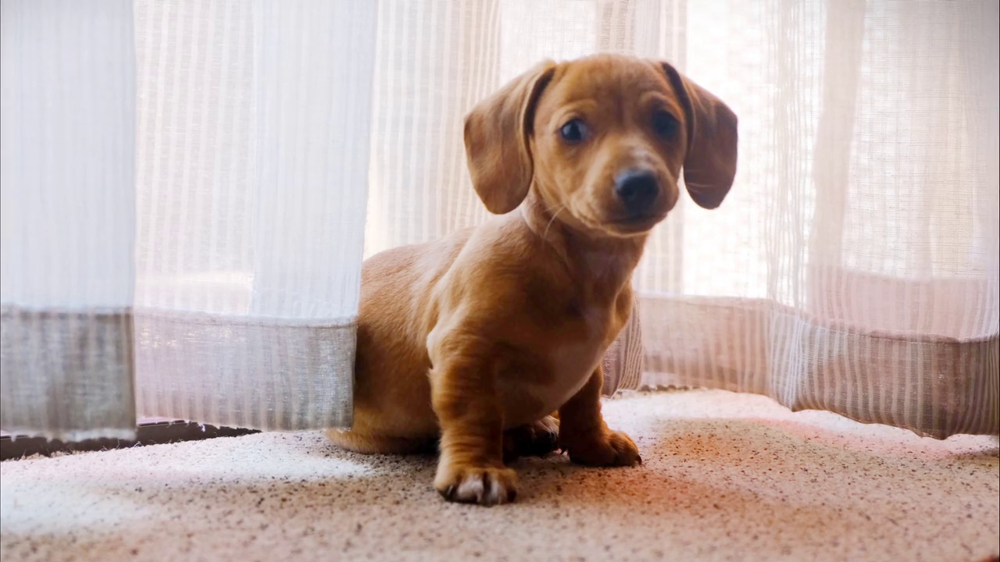

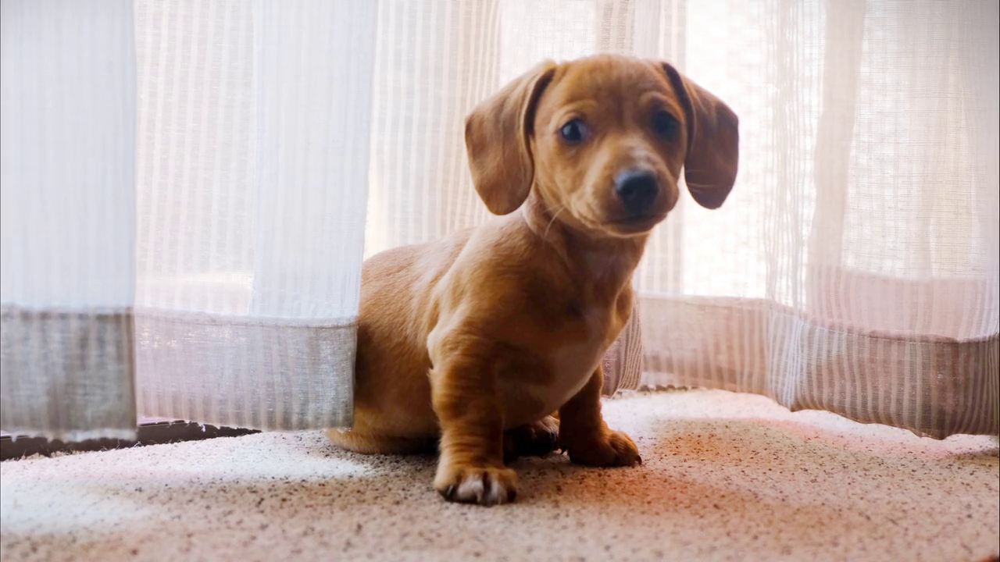

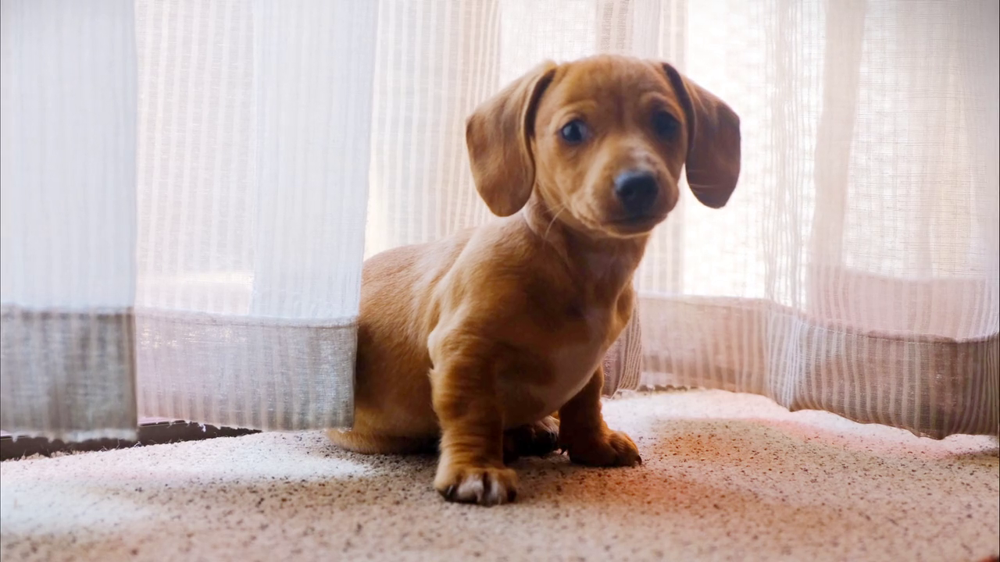

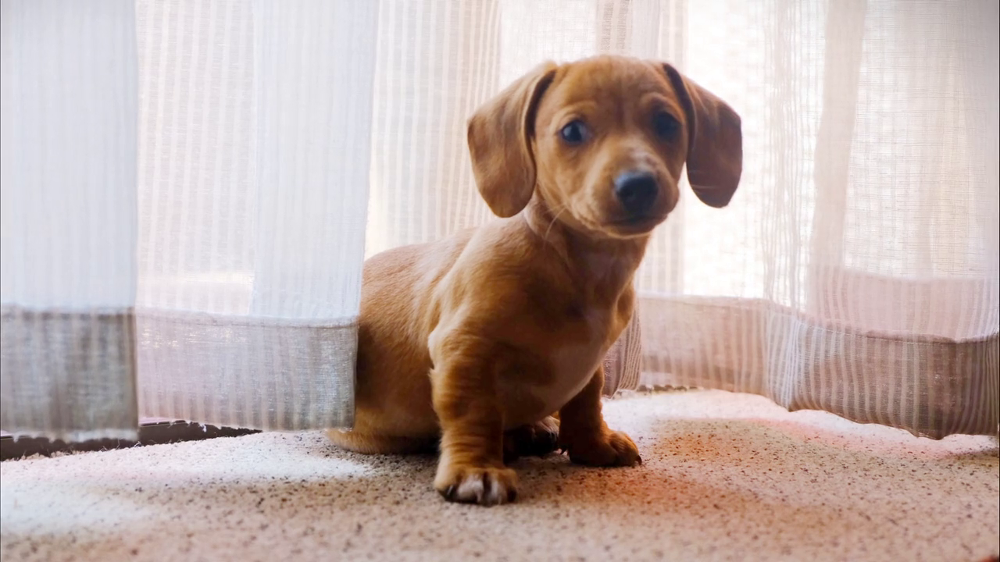

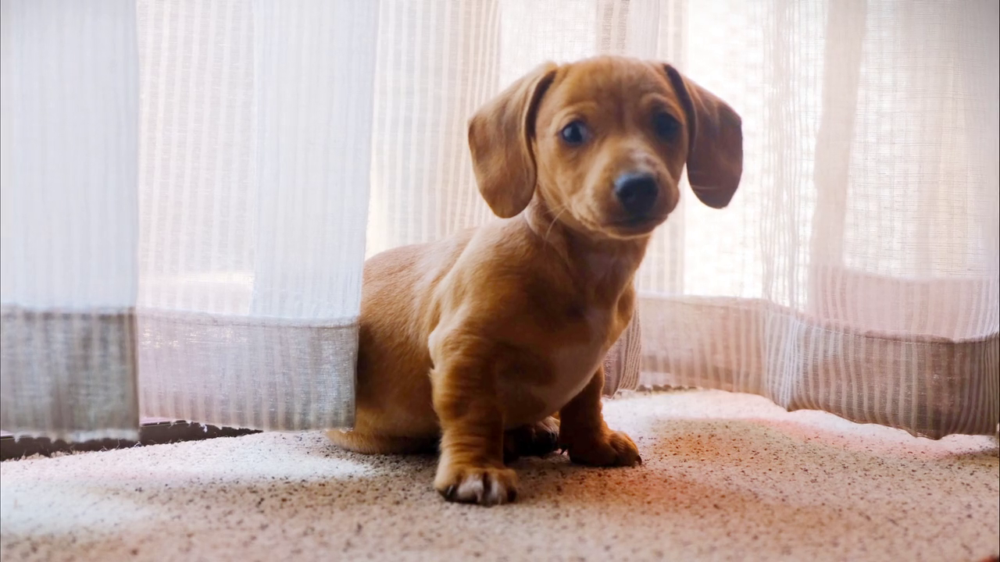

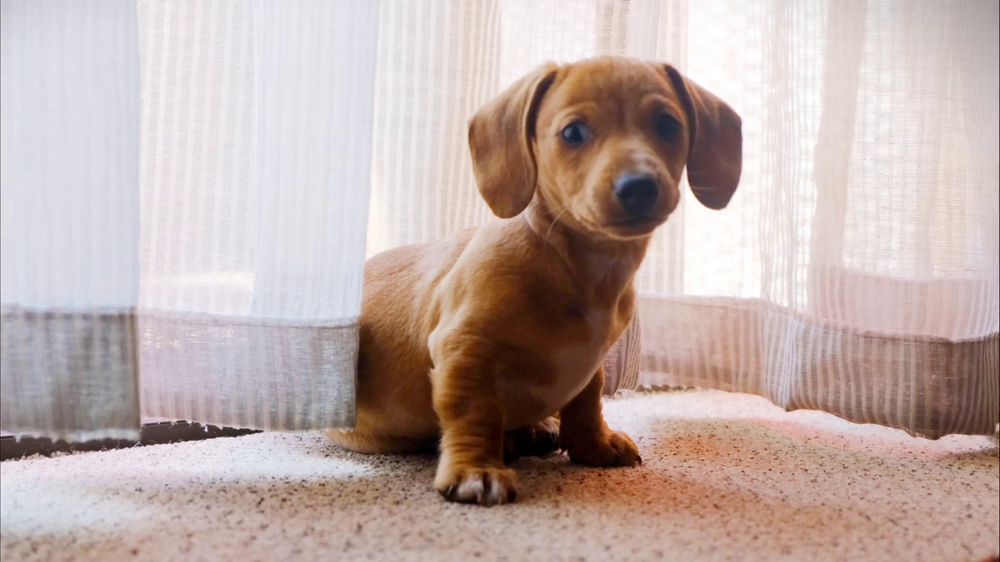

In [ ]:
video_url = "https://raw.githubusercontent.com/jasmcaus/opencv-course/master/Resources/Videos/dog.mp4"

# Download the video data
response = requests.get(video_url)
video_bytes = BytesIO(response.content)

# Create a VideoCapture object from the bytes
# Save the video bytes to a temporary file to be able to read it with cv2.VideoCapture
temp_video_path = '/tmp/temp_video.mp4'
with open(temp_video_path, 'wb') as f:
    f.write(video_bytes.getvalue())

capture = cv.VideoCapture(temp_video_path)

if not capture.isOpened():
    print("Error opening video file")

while True:
    isTrue, frame = capture.read()

    if not isTrue:
        break  # Break the loop if there are no more frames

    # Display the frame using the Colab specific function
    cv2_imshow(frame)

    # Add a delay to control playback speed (optional)
    # For example, wait for 25ms (adjust as needed)
    # if cv.waitKey(25) & 0xFF == ord('d'):
    #     break

capture.release()
cv.destroyAllWindows()

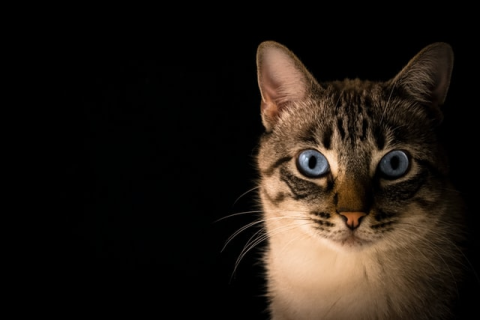

In [ ]:
# resizing the image

def rescaleFramme(frame, scale=0.75):
  width = int(frame.shape[1] * scale)
  height = int(frame.shape[0] * scale)
  dimensions = (width, height)

  return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

# Call the rescaleFrame function on the image
resized_image = rescaleFramme(img_cv)

# Display the resized image
cv2_imshow(resized_image)

In [ ]:
#transformations
# Rotation
def rotate(img, angle, rotPoint=None):
    (height,width) = img.shape[:2]

    if rotPoint is None:
        rotPoint = (width//2,height//2)

    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width,height)

    return cv.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, -45)
cv.imshow('Rotated', rotated)

rotated_rotated = rotate(img, -90)
cv.imshow('Rotated Rotated', rotated_rotated)

# Resizing
resized = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)
cv.imshow('Resized', resized)

# Flipping
flip = cv.flip(img, -1)
cv.imshow('Flip', flip)

# Cropping
cropped = img[200:400, 300:400]
cv.imshow('Cropped', cropped)


cv.waitKey(0)

In [ ]:
#basic functions
# Converting to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)

# Blur
blur = cv.GaussianBlur(img, (7,7), cv.BORDER_DEFAULT)
cv.imshow('Blur', blur)

# Edge Cascade
canny = cv.Canny(blur, 125, 175)
cv.imshow('Canny Edges', canny)

# Dilating the image
dilated = cv.dilate(canny, (7,7), iterations=3)
cv.imshow('Dilated', dilated)

# Eroding
eroded = cv.erode(dilated, (7,7), iterations=3)
cv.imshow('Eroded', eroded)

# Resize
resized = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)
cv.imshow('Resized', resized)

# Cropping
cropped = img[50:200, 200:400]
cv.imshow('Cropped', cropped)

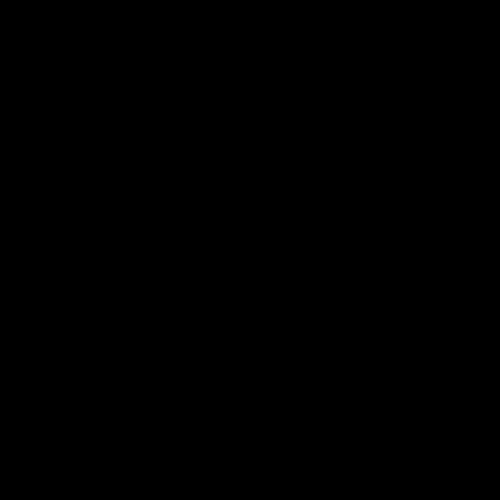

In [ ]:
blank = np.zeros((500,500,3), dtype='uint8')
cv2_imshow(blank)

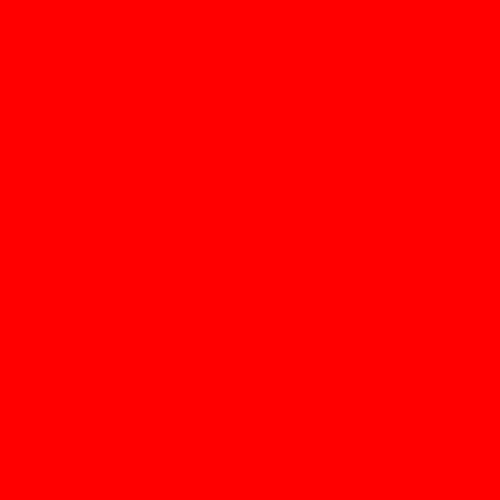

In [ ]:
# 1. Paint the image a certain colour
blank[ : ] = 0,0,255
#blank[200:300, 300:300] = 0,0,255 # some parts
cv2_imshow(blank)

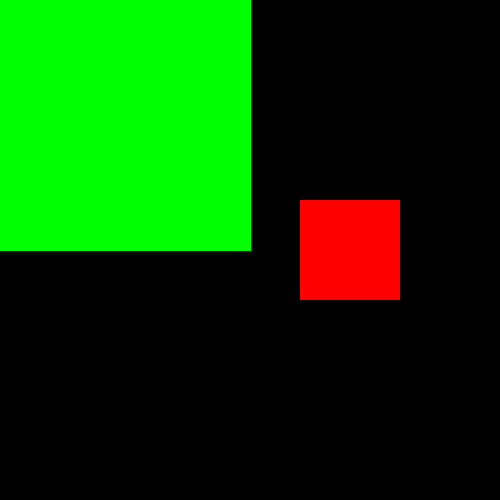

In [ ]:
cv.rectangle(blank, (0,0), (blank.shape[1]//2, blank.shape[0]//2), (0,255,0), thickness=-1)
cv2_imshow(blank)

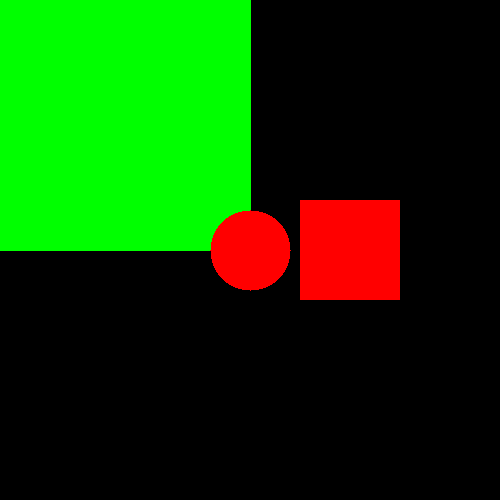

In [ ]:
cv.circle(blank, (blank.shape[1]//2, blank.shape[0]//2), 40, (0,0,255), thickness=-1)
cv2_imshow(blank)

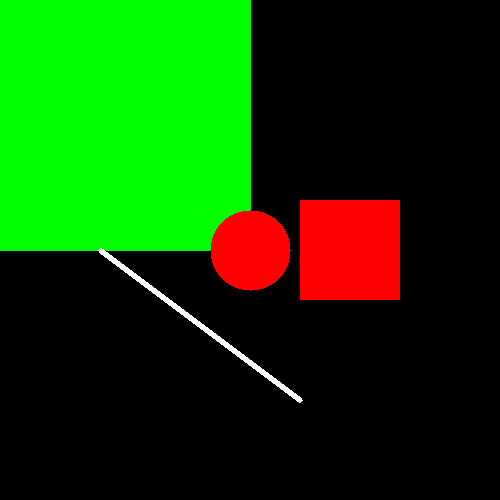

In [ ]:
# 4. Draw a line
cv.line(blank, (100,250), (300,400), (255,255,255), thickness=3)
cv2_imshow(blank)

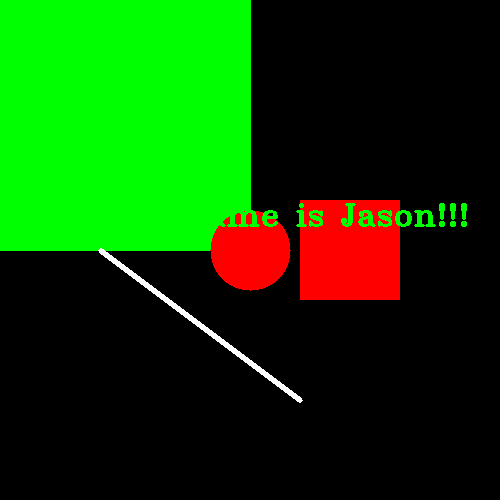

In [ ]:
# 5. Write text
cv.putText(blank, 'Hello, my name is Jason!!!', (0,225), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0,255,0), 2)
cv2_imshow(blank)

Edges, Contours of images

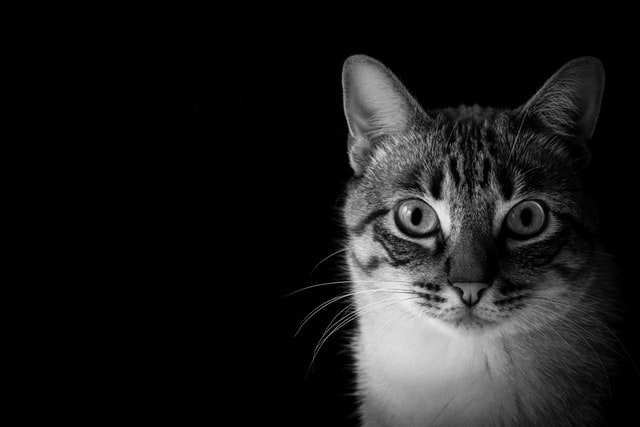

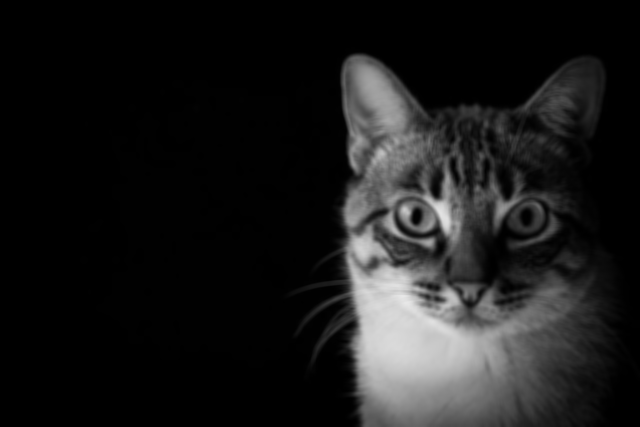

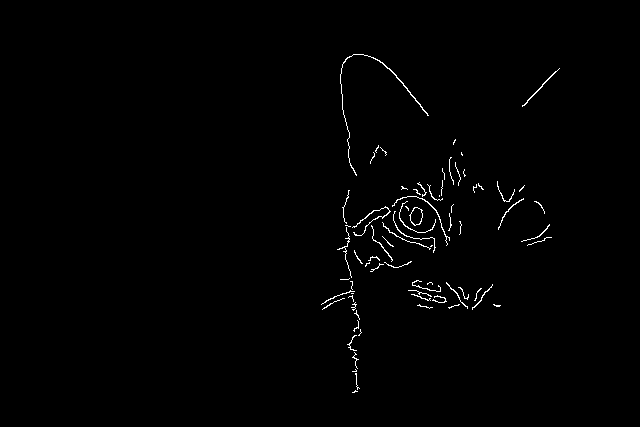

74 contour(s) found!


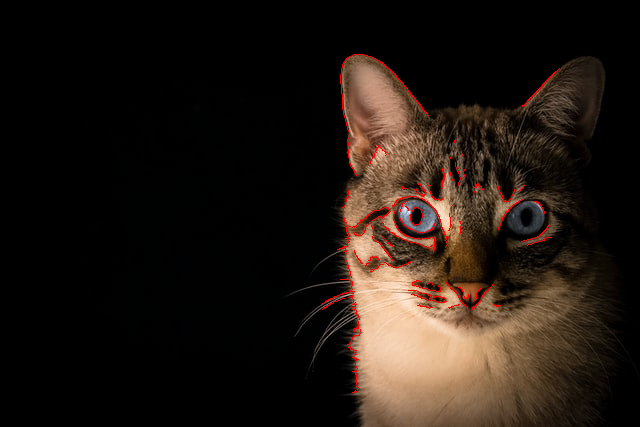

-1

In [9]:
image_url = "https://raw.githubusercontent.com/jasmcaus/opencv-course/master/Resources/Photos/cat.jpg"
# Download the image data
response = requests.get(image_url)
image_bytes = BytesIO(response.content)
# Read the image using OpenCV or Caer
# Using OpenCV
# Reset the BytesIO object's position to the beginning before reading again
image_bytes.seek(0)
image_np = np.frombuffer(image_bytes.read(), np.uint8)
img_cv = cv.imdecode(image_np, cv.IMREAD_COLOR)

gray = cv.cvtColor(img_cv, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
cv2_imshow(blur)

canny = cv.Canny(blur, 125, 175)
cv2_imshow(canny)

# ret, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)
# cv2_imshow('Thresh', thresh)

contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
print(f'{len(contours)} contour(s) found!')

cv.drawContours(img_cv, contours, -1, (0,0,255), 1)
cv2_imshow(img_cv)

cv.waitKey(0)